In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
import numpy as np

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
df_feat= pd.read_csv("/content/drive/MyDrive/walmart sales prediction/features.csv")
df_train=pd.read_csv("/content/drive/MyDrive/walmart sales prediction/train.csv")
df_store=pd.read_csv("/content/drive/MyDrive/walmart sales prediction/stores.csv")


In [9]:
df_store

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875
5,6,A,202505
6,7,B,70713
7,8,A,155078
8,9,B,125833
9,10,B,126512


In [10]:
df_feat

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010/2/5,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010/2/12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010/2/19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010/2/26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010/3/5,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False
...,...,...,...,...,...,...,...,...,...,...,...,...
8185,45,2013/6/28,76.05,3.639,4842.29,975.03,3.00,2449.97,3169.69,NaN,NaN,False
8186,45,2013/7/5,77.50,3.614,9090.48,2268.58,582.74,5797.47,1514.93,NaN,NaN,False
8187,45,2013/7/12,79.37,3.614,3789.94,1827.31,85.72,744.84,2150.36,NaN,NaN,False
8188,45,2013/7/19,82.84,3.737,2961.49,1047.07,204.19,363.00,1059.46,NaN,NaN,False


# Preprocessing

In [11]:
df_mix=df_train.merge(df_feat, on=['Store', 'Date'])
df_mix=df_mix.drop("IsHoliday_y",axis=1)
df_mix

,Store,Dept,Date,Weekly_Sales,IsHoliday_x,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment


In [12]:
df_mix=df_mix.merge(df_store, on=['Store'])
df_mix=df_mix.drop("Type",axis=1)
df_mix

,Dept,Date,Weekly_Sales,IsHoliday_x,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Store,Size


In [13]:
# oh encoding holiday
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df_mix["IsHoliday_x"]=le.fit_transform(df_mix["IsHoliday_x"])
df_train["IsHoliday"]=le.fit_transform(df_train["IsHoliday"])
df_train

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,0
1,1,1,2010-02-12,46039.49,1
2,1,1,2010-02-19,41595.55,0
3,1,1,2010-02-26,19403.54,0
4,1,1,2010-03-05,21827.90,0
...,...,...,...,...,...
421565,45,98,2012-09-28,508.37,0
421566,45,98,2012-10-05,628.10,0
421567,45,98,2012-10-12,1061.02,0
421568,45,98,2012-10-19,760.01,0


In [14]:
# weekly sales norm & date is index
df_train_org=df_train
mms = MinMaxScaler(feature_range = (0, 1))
df_train["Weekly_Sales"]=mms.fit_transform(pd.DataFrame(df_train["Weekly_Sales"]))
df_train.set_index(["Date"],inplace=True)
df_train

,Store,Dept,Weekly_Sales,IsHoliday
Date,,,,
2010-02-05,1,1,0.042851,0
2010-02-12,1,1,0.073097,1
2010-02-19,1,1,0.066732,0
2010-02-26,1,1,0.034942,0
2010-03-05,1,1,0.038415,0
...,...,...,...,...
2012-09-28,45,98,0.007875,0
2012-10-05,45,98,0.008046,0
2012-10-12,45,98,0.008666,0


In [ ]:
#y_train=pd.DataFrame(y_train)
#x_train=df_train.drop("Weekly_Sales",axis=1)

In [ ]:
#mms = MinMaxScaler(feature_range = (0, 1))
#y_train=mms.fit_transform(y_train)
#y_train

In [ ]:
#x_train = np.reshape(x_train, (x_train.shape[0], 1, x_train.shape[1]))
#x_train.shape

In [15]:
#各店各部門數量
for i in range(1,46):
    print("store",i)
    for j in range (1,99):
        a=round(len(df_train[(df_train["Store"] ==i)&(df_train["Dept"] ==j)])*0.80)
        print("department",j,a)


store 1
department 1 114
department 2 114
department 3 114
department 4 114
department 5 114
department 6 114
department 7 114
department 8 114
department 9 114
department 10 114
department 11 114
department 12 114
department 13 114
department 14 114
department 15 0
department 16 114
department 17 114
department 18 90
department 19 114
department 20 114
department 21 114
department 22 114
department 23 114
department 24 114
department 25 114
department 26 114
department 27 114
department 28 114
department 29 114
department 30 114
department 31 114
department 32 114
department 33 114
department 34 114
department 35 114
department 36 114
department 37 114
department 38 114
department 39 0
department 40 114
department 41 114
department 42 114
department 43 0
department 44 114
department 45 57
department 46 114
department 47 18
department 48 100
department 49 114
department 50 0
department 51 26
department 52 114
department 53 0
department 54 106
department 55 114
department 56 114
departm

In [16]:
#trian split
data_train=pd.DataFrame({})
for i in range(1,46):
    for j in range (1,99):
        a=round(len(df_train[(df_train["Store"] ==i)&(df_train["Dept"] ==j)])*0.80)
        data_train=data_train.append(df_train[(df_train["Store"] ==i)&(df_train["Dept"] ==j)].iloc[:a+1])
data_train


串流輸出內容已截斷至最後 5000 行。
<ipython-input-16-aad406ae325b>:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_train=data_train.append(df_train[(df_train["Store"] ==i)&(df_train["Dept"] ==j)].iloc[:a+1])
<ipython-input-16-aad406ae325b>:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_train=data_train.append(df_train[(df_train["Store"] ==i)&(df_train["Dept"] ==j)].iloc[:a+1])
<ipython-input-16-aad406ae325b>:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_train=data_train.append(df_train[(df_train["Store"] ==i)&(df_train["Dept"] ==j)].iloc[:a+1])
<ipython-input-16-aad406ae325b>:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_

,Store,Dept,Weekly_Sales,IsHoliday
Date,,,,
2010-02-05,1,1,0.042851,0
2010-02-12,1,1,0.073097,1
2010-02-19,1,1,0.066732,0
2010-02-26,1,1,0.034942,0
2010-03-05,1,1,0.038415,0
...,...,...,...,...
2012-03-30,45,98,0.008240,0
2012-04-06,45,98,0.008262,0
2012-04-13,45,98,0.007948,0


In [17]:
7#test split
data_test=pd.DataFrame({})
for i in range(1,46):
    for j in range (1,99):
        a=round(len(df_train[(df_train["Store"] ==i)&(df_train["Dept"] ==j)])*0.80)
        data_test=data_test.append(df_train[(df_train["Store"] ==i)&(df_train["Dept"] ==j)].iloc[a+1:])
data_test

串流輸出內容已截斷至最後 5000 行。
<ipython-input-17-971d07e93707>:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_test=data_test.append(df_train[(df_train["Store"] ==i)&(df_train["Dept"] ==j)].iloc[a+1:])
<ipython-input-17-971d07e93707>:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_test=data_test.append(df_train[(df_train["Store"] ==i)&(df_train["Dept"] ==j)].iloc[a+1:])
<ipython-input-17-971d07e93707>:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_test=data_test.append(df_train[(df_train["Store"] ==i)&(df_train["Dept"] ==j)].iloc[a+1:])
<ipython-input-17-971d07e93707>:6: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_test=d

,Store,Dept,Weekly_Sales,IsHoliday
Date,,,,
2012-04-20,1,1,0.031465,0
2012-04-27,1,1,0.030564,0
2012-05-04,1,1,0.031710,0
2012-05-11,1,1,0.033166,0
2012-05-18,1,1,0.033673,0
...,...,...,...,...
2012-09-28,45,98,0.007875,0
2012-10-05,45,98,0.008046,0
2012-10-12,45,98,0.008666,0


In [18]:
sequences= pd.DataFrame({})
labels= pd.DataFrame({})
for i in range(1,3):
    print("store",i)
    for j in range (16,19):
        start_idx = 0
        print("dept",j)
        c=df_train[(df_train["Store"] ==i)&(df_train["Dept"] ==j)]
        b=round(len(c)*0.8)
        for stop_idx in range(30, b):
            print("past",start_idx,stop_idx,"pred",stop_idx)
            sequences.append(c.iloc[start_idx:stop_idx])
            labels.append(c.iloc[stop_idx])
            start_idx += 1

store 1
dept 16
past 0 30 pred 30
past 1 31 pred 31
past 2 32 pred 32
past 3 33 pred 33
past 4 34 pred 34
past 5 35 pred 35
past 6 36 pred 36
past 7 37 pred 37
past 8 38 pred 38
past 9 39 pred 39
past 10 40 pred 40
past 11 41 pred 41
past 12 42 pred 42
past 13 43 pred 43
past 14 44 pred 44
past 15 45 pred 45
past 16 46 pred 46
past 17 47 pred 47
past 18 48 pred 48
past 19 49 pred 49
past 20 50 pred 50
past 21 51 pred 51
past 22 52 pred 52
past 23 53 pred 53
past 24 54 pred 54
past 25 55 pred 55
past 26 56 pred 56
past 27 57 pred 57
past 28 58 pred 58
past 29 59 pred 59
past 30 60 pred 60
past 31 61 pred 61
past 32 62 pred 62
past 33 63 pred 63
past 34 64 pred 64
past 35 65 pred 65
past 36 66 pred 66
past 37 67 pred 67
past 38 68 pred 68
past 39 69 pred 69
past 40 70 pred 70
past 41 71 pred 71
past 42 72 pred 72
past 43 73 pred 73
past 44 74 pred 74
past 45 75 pred 75
past 46 76 pred 76
past 47 77 pred 77
past 48 78 pred 78
past 49 79 pred 79
past 

<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat in

50 80 pred 80
past 51 81 pred 81
past 52 82 pred 82
past 53 83 pred 83
past 54 84 pred 84
past 55 85 pred 85
past 56 86 pred 86
past 57 87 pred 87
past 58 88 pred 88
past 59 89 pred 89
past 60 90 pred 90
past 61 91 pred 91
past 62 92 pred 92
past 63 93 pred 93
past 64 94 pred 94
past 65 95 pred 95
past 66 96 pred 96
past 67 97 pred 97


<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat in

past 68 98 pred 98
past 69 99 pred 99
past 70 100 pred 100
past 71 101 pred 101
past 72 102 pred 102
past 73 103 pred 103
past 74 104 pred 104
past 75 105 pred 105
past 76 106 pred 106
past 77 107 pred 107
past 78 108 pred 108
past 79 109 pred 109
past 80 110 pred 110
past 81 111 pred 111
past 82 112 pred 112
past 83 113 pred 113
dept 17
past 0 30 pred 30
past 1 31 pred 31
past 2 32 pred 32
past 3 33 pred 33
past 4 34 pred 34
past 5 35 pred 35
past 6 36 pred 36
past 7 37 pred 37
past 8 38 pred 38
past 9 39 pred 39
past 10 40 pred 40
past 11 41 pred 41
past 12 42 pred 42
past 13 43 pred 43
past 14 44 pred 44
past 15 45 pred 45
past 16 46 pred 46
past 17 47 pred 47
past 18 48 pred 48
past 19 49 pred 49
past 20 50 pred 50
past 21 51 pred 51
past 22 52 pred 52
past 23 53 pred 53
past 24 54 pred 54
past 25 55 pred 55
past 26 56 pred 56
past 27

<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat in

 57 pred 57
past 28 58 pred 58
past 29 59 pred 59
past 30 60 pred 60
past 31 61 pred 61
past 32 62 pred 62
past 33 63 pred 63
past 34 64 pred 64
past 35 65 pred 65
past 36 66 pred 66
past 37 67 pred 67
past 38 68 pred 68
past 39 69 pred 69
past 40 70 pred 70
past 41 71 pred 71
past 42 72 pred 72
past 43 73 pred 73
past 44 74 pred 74
past 45 75 pred 75
past 46 76 pred 76
past 47 77 pred 77
past 48 78 pred 78
past 49 79 pred 79
past 50 80 pred 80
past 51 81 pred 81
past 52 82 pred 82
past 53 83 pred 83
past 54 84 pred 84
past 55 85 pred 85
past 56 86 pred 86
past 57 87 pred 87
past 58 88 pred 88
past 59 89 pred 89
past 60 90 pred 90
past 61 91 pred 91
past 62 92 pred 92
past 63 93 pred 93
past 64 94 pred 94
past 65 95 pred 95
past 66 96 pred 96
past 67 97 pred 97
past 68 98 pred 98
past 69 99 pred 99
past 70 100 pred 100
past 71 101 pred 101
past 

<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat in

72 102 pred 102
past 73 103 pred 103
past 74 104 pred 104
past 75 105 pred 105
past 76 106 pred 106
past 77 107 pred 107
past 78 108 pred 108
past 79 109 pred 109
past 80 110 pred 110
past 81 111 pred 111
past 82 112 pred 112
past 83 113 pred 113
dept 18
past 0 30 pred 30
past 1 31 pred 31
past 2 32 pred 32
past 3 33 pred 33
past 4 34 pred 34
past 5 35 pred 35
past 6 36 pred 36
past 7 37 pred 37
past 8 38 pred 38
past 9 39 pred 39
past 10 40 pred 40
past 11 41 pred 41
past 12 42 pred 42
past 13 43 pred 43
past 14 44 pred 44
past 15 45 pred 45
past 16 46 pred 46
past 17 47 pred 47
past 18 48 pred 48
past 19 49 pred 49
past 20 50 pred 50
past 21 51 pred 51
past 22 52 pred 52
past 23 53 pred 53
past 24 54 pred 54
past 25 55 pred 55
past 26 56 pred 56
past 27 57 pred 57
past 28 58 pred 58
past 29 59 pred 59
past 30 60 pred 60
past 31 61 pred 61
past 32 62 pred 62
past 

<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat in

33 63 pred 63
past 34 64 pred 64
past 35 65 pred 65
past 36 66 pred 66
past 37 67 pred 67
past 38 68 pred 68
past 39 69 pred 69
past 40 70 pred 70
past 41 71 pred 71
past 42 72 pred 72
past 43 73 pred 73
past 44 74 pred 74
past 45 75 pred 75
past 46 76 pred 76
past 47 77 pred 77
past 48 78 pred 78
past 49 79 pred 79
past 50 80 pred 80


<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat in

past 51 81 pred 81
past 52 82 pred 82
past 53 83 pred 83
past 54 84 pred 84
past 55 85 pred 85
past 56 86 pred 86
past 57 87 pred 87
past 58 88 pred 88
past 59 89 pred 89
store 2
dept 16
past 0 30 pred 30
past 1 31 pred 31
past 2 32 pred 32
past 3 33 pred 33
past 4 34 pred 34
past 5 35 pred 35
past 6 36 pred 36
past 7 37 pred 37
past 8 38 pred 38
past 9 39 pred 39
past 10 40 pred 40
past 11 41 pred 41
past 12 42 pred 42
past 13 43 pred 43
past 14 44 pred 44
past 15 45 pred 45
past 16 46 pred 46
past 17 47 pred 47
past 18 48 pred 48
past 19 49 pred 49
past 20 50 pred 50
past 21 51 pred 51
past 22 52 pred 52
past 23 53 pred 53
past 24 54 pred 54
past 25 55 pred 55
past 26 56 pred 56
past 27 57 pred 57
past 28 58 pred 58
past 29 59 pred 59
past 

<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat in

30 60 pred 60
past 31 61 pred 61
past 32 62 pred 62
past 33 63 pred 63
past 34 64 pred 64
past 35 65 pred 65
past 36 66 pred 66
past 37 67 pred 67
past 38 68 pred 68
past 39 69 pred 69
past 40 70 pred 70
past 41 71 pred 71
past 42 72 pred 72
past 43 73 pred 73
past 44 74 pred 74
past 45 75 pred 75
past 46 76 pred 76
past 47 77 pred 77
past 48 78 pred 78
past 49 79 pred 79
past 50 80 pred 80
past 51 81 pred 81
past 52 82 pred 82
past 53 83 pred 83
past 54 84 pred 84
past 55 85 pred 85
past 56 86 pred 86
past 57 87 pred 87
past 58 88 pred 88
past 59 89 pred 89
past 60 90 pred 90
past 61 91 pred 91
past 62 92 pred 92
past 63 93 pred 93
past 64 94 pred 94
past 65 95 pred 95
past 66 96 pred 96
past 67 97 pred 97
past 68 98 pred 98
past 69 99 pred 99
past 70 100 pred 100
past 71 101 pred 101
past 72 102 pred 102
past 73 103 pred 103
past 74 104 pred 104
past 75 105 pred 105
past 76 106 pred 106
past 77 107 pred 107
past 78 108 pred 108
past 79 109 pred 109
past 80 110 pred 110
past 81 111 pr

<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat in

83 113 pred 113
dept 17
past 0 30 pred 30
past 1 31 pred 31
past 2 32 pred 32
past 3 33 pred 33
past 4 34 pred 34
past 5 35 pred 35
past 6 36 pred 36
past 7 37 pred 37
past 8 38 pred 38
past 9 39 pred 39
past 10 40 pred 40
past 11 41 pred 41
past 12 42 pred 42
past 13 43 pred 43
past 14 44 pred 44
past 15 45 pred 45
past 16 46 pred 46
past 17 47 pred 47
past 18 48 pred 48
past 19 49 pred 49
past 20 50 pred 50
past 21 51 pred 51
past 22 52 pred 52
past 23 53 pred 53
past 24 54 pred 54
past 25 55 pred 55
past 26 56 pred 56
past 27 57 pred 57
past 28 58 pred 58
past 29 59 pred 59
past 30 60 pred 60
past 31 61 pred 61
past 32 62 pred 62
past 33 63 pred 63
past 34 64 pred 64
past 35 65 pred 65
past 36 66 pred 66
past 37 67 pred 67
past 38 68 pred 68
past 39 69 pred 69
past 40 70 pred 70
past 41 71 pred 71
past 42 72 pred 72
past 

<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat in

43 73 pred 73
past 44 74 pred 74
past 45 75 pred 75
past 46 76 pred 76
past 47 77 pred 77
past 48 78 pred 78
past 49 79 pred 79
past 50 80 pred 80
past 51 81 pred 81
past 52 82 pred 82
past 53 83 pred 83
past 54 84 pred 84
past 55 85 pred 85
past 56 86 pred 86
past 57 87 pred 87
past 58 88 pred 88
past 59 89 pred 89

<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat in


past 60 90 pred 90
past 61 91 pred 91
past 62 92 pred 92
past 63 93 pred 93
past 64 94 pred 94
past 65 95 pred 95
past 66 96 pred 96
past 67 97 pred 97
past 68 98 pred 98
past 69 99 pred 99
past 70 100 pred 100
past 71 101 pred 101
past 72 102 pred 102
past 73 103 pred 103
past 74 104 pred 104
past 75 105 pred 105
past 76 106 pred 106
past 77 107 pred 107
past 78 108 pred 108
past 79 109 pred 109
past 80 110 pred 110
past 81 111 pred 111
past 82 112 pred 112
past 83 113 pred 113
dept 18
past 0 30 pred 30
past 1 31 pred 31
past 2 32 pred 32
past 3 33 pred 33
past 4 34 pred 34
past 5 35 pred 35
past 6 36 pred 36
past 7 37 pred 37
past 8 38 pred 38
past 9 39 pred 39
past 10 40 pred 40
past 11 41 pred 41
past 12 42 pred 42
past 13 43 pred 43
past 14 44 pred 44
past 15 45 pred 45
past 16 46 pred 46
past 17 47 pred 47
past 18 48 pred 48
past 

<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat in

19 49 pred 49
past 20 50 pred 50
past 21 51 pred 51
past 22 52 pred 52
past 23 53 pred 53
past 24 54 pred 54
past 25 55 pred 55
past 26 56 pred 56
past 27 57 pred 57
past 28 58 pred 58
past 29 59 pred 59
past 30 60 pred 60
past 31 61 pred 61
past 32 62 pred 62
past 33 63 pred 63
past 34 64 pred 64
past 35 65 pred 65
past 36 66 pred 66
past 37 67 pred 67
past 38 68 pred 68
past 39 69 pred 69
past 40 70 pred 70
past 41 71 pred 71
past 42 72 pred 72
past 43 73 pred 73
past 44 74 pred 74
past 45 75 pred 75
past 46 76 pred 76
past 47 77 pred 77
past 48 78 pred 78
past 49 79 pred 79
past 50 80 pred 80
past 51 81 pred 81
past 52 82 pred 82
past 53 83 pred 83
past 54 84 pred 84
past 55 85 pred 85
past 56 86 pred 86
past 57 87 pred 87
past 58 88 pred 88
past 59 89 pred 89


<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  labels.append(c.iloc[stop_idx])
<ipython-input-18-bcdd593631a5>:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sequences.append(c.iloc[start_idx:stop_idx])
<ipython-input-18-bcdd593631a5>:13: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat in

In [19]:
def create_sequence(dataset, time_st =52):
    sequences= []
    labels=[]
    for i in range(1,46):
        print("store",i)
        for j in range (1,99):
            start_idx = 0
            c=df_train[(df_train["Store"] ==i)&(df_train["Dept"] ==j)]
            b=round(len(c)*0.8)
            for stop_idx in range(52, b):
                sequences.append(c.iloc[start_idx:stop_idx,0:c.shape[1]])
                labels.append(c.iloc[stop_idx,2])
                start_idx += 1
    return (np.array(sequences), np.array(labels))

In [20]:
train_seq, train_label = create_sequence(data_train, time_st =52)
test_seq, test_label = create_sequence(data_test)

store 1
store 2
store 3
store 4
store 5
store 6
store 7
store 8
store 9
store 10
store 11
store 12
store 13
store 14
store 15
store 16
store 17
store 18
store 19
store 20
store 21
store 22
store 23
store 24
store 25
store 26
store 27
store 28
store 29
store 30
store 31
store 32
store 33
store 34
store 35
store 36
store 37
store 38
store 39
store 40
store 41
store 42
store 43
store 44
store 45
store 1
store 2
store 3
store 4
store 5
store 6
store 7
store 8
store 9
store 10
store 11
store 12
store 13
store 14
store 15
store 16
store 17
store 18
store 19
store 20
store 21
store 22
store 23
store 24
store 25
store 26
store 27
store 28
store 29
store 30
store 31
store 32
store 33
store 34
store 35
store 36
store 37
store 38
store 39
store 40
store 41
store 42
store 43
store 44
store 45


In [21]:
train_seq[0]

array([[1.        , 1.        , 0.04285051, 0.        ],
       [1.        , 1.        , 0.07309739, 1.        ],
       [1.        , 1.        , 0.06673152, 0.        ],
       [1.        , 1.        , 0.03494183, 0.        ],
       [1.        , 1.        , 0.03841468, 0.        ],
       [1.        , 1.        , 0.03729088, 0.        ],
       [1.        , 1.        , 0.03885695, 0.        ],
       [1.        , 1.        , 0.04471949, 0.        ],
       [1.        , 1.        , 0.08916833, 0.        ],
       [1.        , 1.        , 0.06868737, 0.        ],
       [1.        , 1.        , 0.03235393, 0.        ],
       [1.        , 1.        , 0.03027452, 0.        ],
       [1.        , 1.        , 0.0308615 , 0.        ],
       [1.        , 1.        , 0.03209176, 0.        ],
       [1.        , 1.        , 0.03425882, 0.        ],
       [1.        , 1.        , 0.02830871, 0.        ],
       [1.        , 1.        , 0.02946528, 0.        ],
       [1.        , 1.        ,

In [22]:
train_label[0]

0.0381824190435508

In [23]:
train_seq.shape

(176874, 52, 4)

In [24]:
train_label.shape

(176874,)

# model training

In [25]:
from tensorflow import keras as ks

In [26]:
lstm_model = ks.models.Sequential()
lstm_model.add(ks.layers.LSTM(units = 50, return_sequences = True, input_shape = (train_seq.shape[1],train_seq.shape[2])))


lstm_model.add(ks.layers.LSTM(units = 50, return_sequences = True))


lstm_model.add(ks.layers.LSTM(units = 50, return_sequences = True))


lstm_model.add(ks.layers.LSTM(units = 50, return_sequences = True))


lstm_model.add(ks.layers.LSTM(units = 50, return_sequences = True))


lstm_model.add(ks.layers.LSTM(units = 50, return_sequences = True))


lstm_model.add(ks.layers.LSTM(units = 50))


lstm_model.add(ks.layers.Dense(units = 1))
lstm_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 52, 50)            11000     
                                                                 
 lstm_1 (LSTM)               (None, 52, 50)            20200     
                                                                 
 lstm_2 (LSTM)               (None, 52, 50)            20200     
                                                                 
 lstm_3 (LSTM)               (None, 52, 50)            20200     
                                                                 
 lstm_4 (LSTM)               (None, 52, 50)            20200     
                                                                 
 lstm_5 (LSTM)               (None, 52, 50)            20200     
                                                                 
 lstm_6 (LSTM)               (None, 50)                2

In [27]:
# 編譯模型

lstm_model.compile(loss = 'mean_squared_error', optimizer ="adam", metrics = ['mean_absolute_error'])


In [28]:
import tensorflow as tf
from tensorflow.keras import layers

In [29]:
tf.keras.regularizers.L2(l2=0.01)

In [30]:
# 訓練模型
history=lstm_model.fit(train_seq,train_label, epochs = 20, batch_size =50 )

Epoch 1/20
3538/3538 [==============================] - 942s 262ms/step - loss: 5.2805e-04 - mean_absolute_error: 0.0133
Epoch 2/20
3538/3538 [==============================] - 925s 261ms/step - loss: 1.5144e-04 - mean_absolute_error: 0.0066
Epoch 3/20
3538/3538 [==============================] - 927s 262ms/step - loss: 1.0374e-04 - mean_absolute_error: 0.0053
Epoch 4/20
3538/3538 [==============================] - 928s 262ms/step - loss: 9.7081e-05 - mean_absolute_error: 0.0050
Epoch 5/20
3538/3538 [==============================] - 931s 263ms/step - loss: 9.9999e-05 - mean_absolute_error: 0.0051
Epoch 6/20
3538/3538 [==============================] - 931s 263ms/step - loss: 8.7536e-05 - mean_absolute_error: 0.0048
Epoch 7/20
3538/3538 [==============================] - 921s 260ms/step - loss: 7.0271e-05 - mean_absolute_error: 0.0045
Epoch 8/20
3538/3538 [==============================] - 931s 263ms/step - loss: 5.9736e-05 - mean_absolute_error: 0.0043
Epoch 9/20
3538/3538 [==========

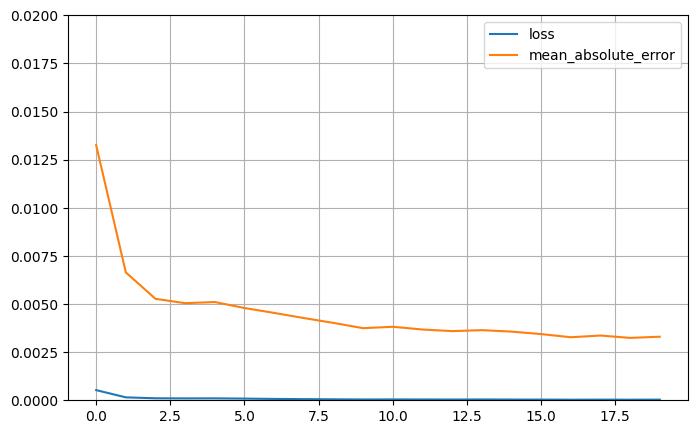

In [31]:
pd.DataFrame(history.history).plot(figsize = (8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 0.02)

plt.show()

In [32]:
lstm_test_predicted = lstm_model.predict(test_seq)

5528/5528 [==============================] - 361s 65ms/step


In [33]:
lstm_test_predicted

array([[0.04125934],
       [0.05253794],
       [0.07627758],
       ...,
       [0.00918832],
       [0.00905081],
       [0.00898268]], dtype=float32)

In [35]:
lstm_model_inverse_predicted=mms.inverse_transform(lstm_test_predicted)
lstm_model_inverse_predicted

array([[23813.723 ],
       [31687.182 ],
       [48259.547 ],
       ...,
       [ 1425.3165],
       [ 1329.3212],
       [ 1281.7617]], dtype=float32)

In [36]:
test_label_reshape= np.reshape(test_label, (test_label.shape[0],1))
test_label_reshape.shape

(176874, 1)

In [38]:
test_label_reshape_actual=mms.inverse_transform(test_label_reshape)
test_label_reshape_actual

array([[21665.76],
       [37887.17],
       [46845.87],
       ...,
       [  778.7 ],
       [  559.14],
       [  605.8 ]])

In [39]:
d=pd.DataFrame(lstm_test_predicted,columns=["pred"])
e=pd.DataFrame(test_label_reshape,columns=["actual"])
f=pd.concat([e,d],axis=1)
f

,actual,pred
0,0.038182,0.041259
1,0.061419,0.052538
2,0.074253,0.076278
3,0.034885,0.043234
4,0.036266,0.039434
...,...,...
176869,0.007936,0.009114
176870,0.008240,0.008977
176871,0.008262,0.009188
176872,0.007948,0.009051


In [40]:
#@title 預設標題文字
sum((f['pred']-f['actual'])**2)

4.477837048352632

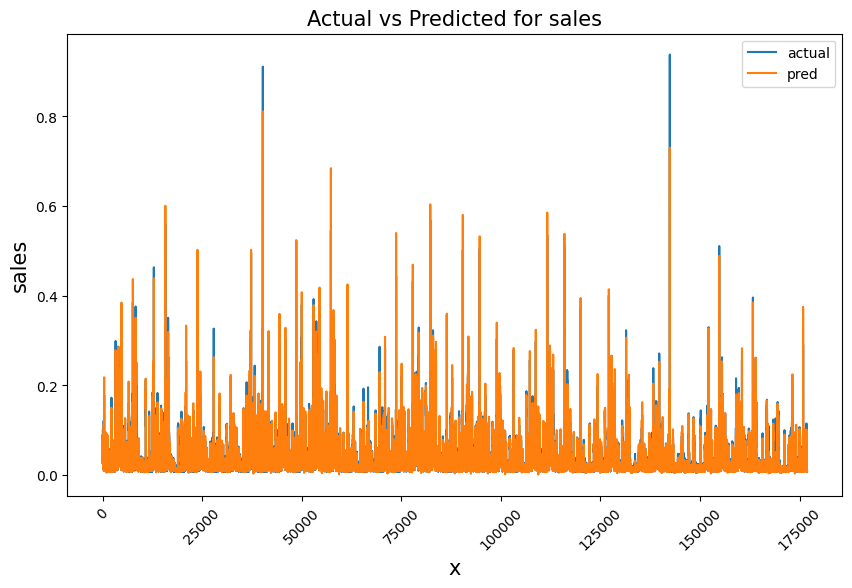

In [41]:
f[['actual', 'pred']].plot(figsize = (10, 6))
plt.xticks(rotation = 45)
plt.xlabel('x', size = 15)
plt.ylabel('sales', size = 15)
plt.title('Actual vs Predicted for sales', size = 15)

plt.show()

# Visualization

Text(0.5, 1.0, 'Store Count ')

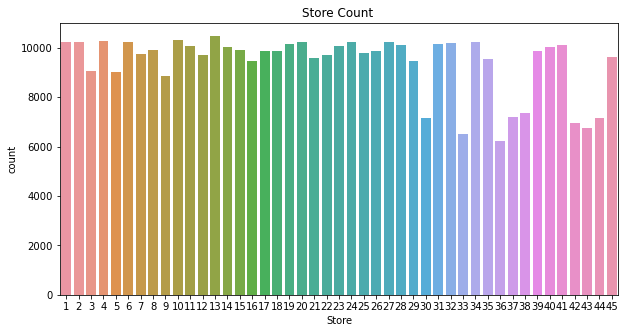

In [ ]:
#stores 在 train 的數量
bar, ax = plt.subplots(figsize=(10,5))
sns.countplot(x="Store", data=df_train)
plt.title("Store Count ")

In [ ]:
a=(df_store["Type"] == "A")
df_store[a]


,Store,Type,Size
0,1,A,151315
1,2,A,202307
3,4,A,205863
5,6,A,202505
7,8,A,155078
10,11,A,207499
12,13,A,219622
13,14,A,200898
18,19,A,203819
19,20,A,203742


In [ ]:
a=(df_store["Type"] == "A")
a.value_counts()


False    23
True     22
Name: Type, dtype: int64

In [ ]:
MarkDown1_null= df_mix["MarkDown1"].isnull()
MarkDown2_null= df_mix["MarkDown2"].isnull()
MarkDown3_null= df_mix["MarkDown3"].isnull()
null_1=pd.DataFrame(MarkDown1_null.value_counts())
null_2=pd.DataFrame(MarkDown2_null.value_counts())
null_3=pd.DataFrame(MarkDown3_null.value_counts())
pd.concat([null_1,null_2,null_3],axis=1)

,MarkDown1,MarkDown2,MarkDown3
True,270889,310322,284479
False,150681,111248,137091


In [ ]:
df_mix[df_mix["IsHoliday_x"]==1]

,Store,Dept,Date,Weekly_Sales,IsHoliday_x,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
73,1,1,2010-02-12,46039.49,1,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106
74,1,2,2010-02-12,44682.74,1,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106
75,1,3,2010-02-12,10887.84,1,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106
76,1,4,2010-02-12,35351.21,1,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106
77,1,5,2010-02-12,29620.81,1,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
421096,45,93,2012-09-07,3607.37,1,75.70,3.911,11024.45,12.8,52.63,1854.77,2055.7,191.577676,8.684
421097,45,94,2012-09-07,3938.63,1,75.70,3.911,11024.45,12.8,52.63,1854.77,2055.7,191.577676,8.684
421098,45,95,2012-09-07,52417.47,1,75.70,3.911,11024.45,12.8,52.63,1854.77,2055.7,191.577676,8.684
421099,45,97,2012-09-07,7426.19,1,75.70,3.911,11024.45,12.8,52.63,1854.77,2055.7,191.577676,8.684


In [ ]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
df_mix_nor=df_mix

In [ ]:
#high temp has high sales
temp_mean=(df_mix["Fuel_Price"].max()+df_mix["Fuel_Price"].min())//2
a=(df_mix["Fuel_Price"] <temp_mean)
b=(df_mix["Fuel_Price"] >temp_mean)
print("low Fuel_Price",df_mix[a]["Weekly_Sales"].sum())
print("high Fuel_Price",df_mix[b]["Weekly_Sales"].sum())

low Fuel_Price 1942587869.7599998
high Fuel_Price 4788268700.930001


In [ ]:
# high fuel price has high sales
temp_mean=(df_mix["Temperature"].max()+df_mix["Temperature"].min())//2
a=(df_mix["Temperature"] <temp_mean)
b=(df_mix["Temperature"] >temp_mean)
print("low temperature",df_mix[a]["Weekly_Sales"].sum())
print("high temperature",df_mix[b]["Weekly_Sales"].sum())

low temperature 1937325210.9
high temperature 4796352179.53


In [ ]:
#temp plot
bar, ax = plt.subplots(figsize = (200,100))

plt.plot(df_feat["Date"], df_feat["Temperature"], 'r-o')
plt.xlabel('Date')
plt.ylabel('temp')
#plt.axis([0, 10, 15, 40])

plt.show()

In [ ]:
df_mix["Date"] <"2011-01-01"

0          True
1          True
2          True
3          True
4          True
          ...  
421565    False
421566    False
421567    False
421568    False
421569    False
Name: Date, Length: 421570, dtype: bool

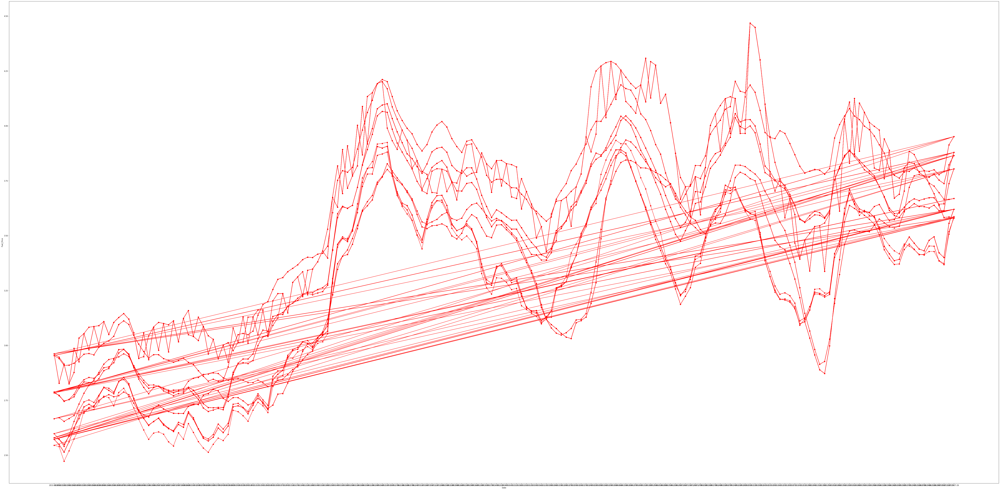

In [ ]:
# fuel price plot
bar, ax = plt.subplots(figsize = (100,50))

plt.plot(df_feat["Date"], df_feat["Fuel_Price"], 'r-o')
plt.xlabel('Date')
plt.ylabel('Fuel_Price')

plt.show()

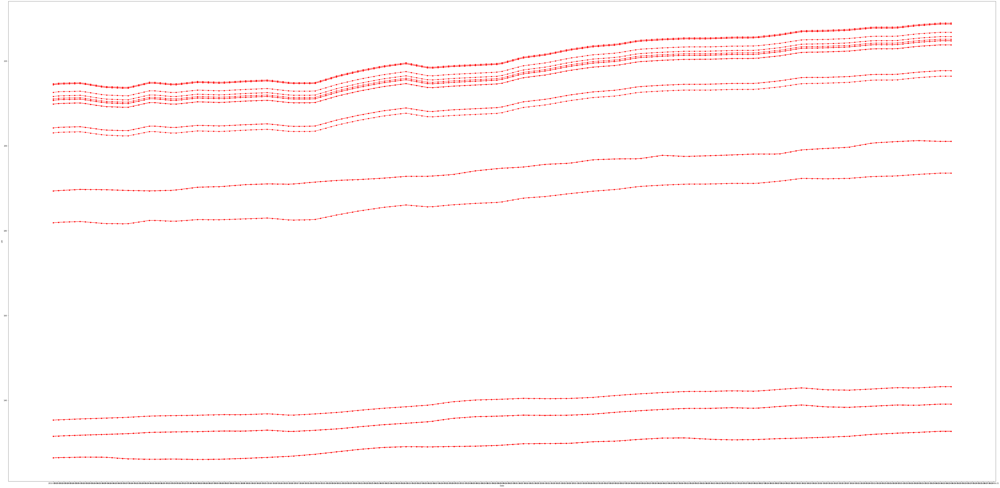

In [ ]:
# cpi plot
bar, ax = plt.subplots(figsize = (100,50))
plt.plot(df_feat["Date"], df_feat["CPI"], 'r-o')
plt.xlabel('Date')
plt.ylabel('CPI')

plt.show()


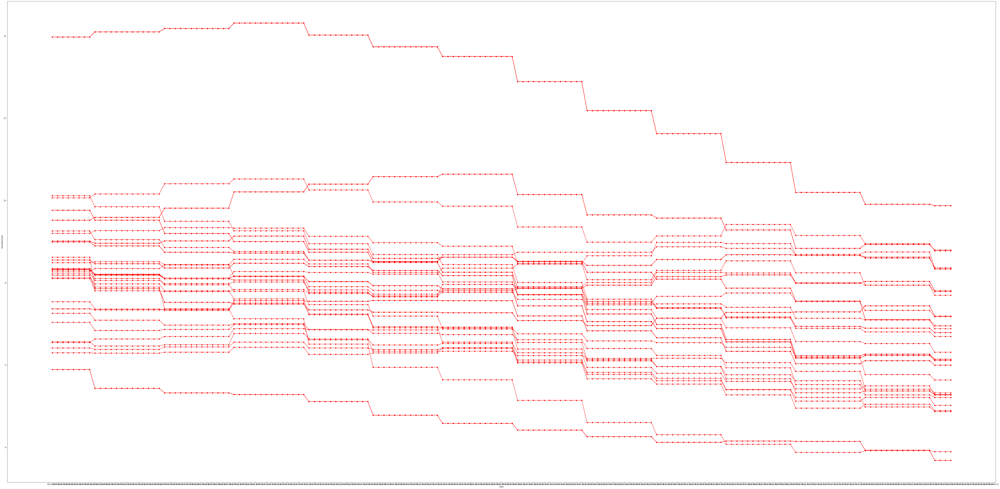

In [ ]:
# Unemployment plot
bar, ax = plt.subplots(figsize = (100,50))
plt.plot(df_feat["Date"], df_feat["Unemployment"], 'r-o')
plt.xlabel('Date')
plt.ylabel('Unemployment')

plt.show()

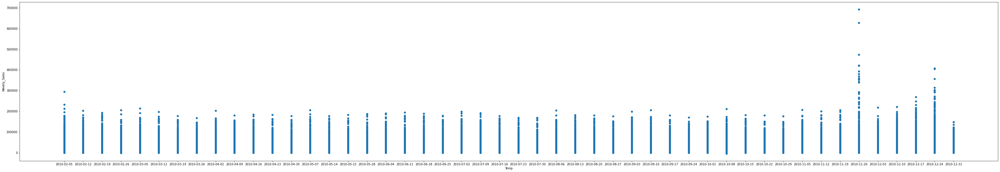

2010sales: 2288886120.4099994
2011sales: 2448200007.35
2012sales: 2000132859.3500001


In [ ]:
#sales plot in 2010.2011.2012
bar, ax = plt.subplots(figsize = (60,10))
df_2010=(df_mix["Date"] <"2011-01-01")
df_2011=(df_mix["Date"] >"2010-12-31")&(df_mix["Date"] <"2012-01-01")
df_2012=(df_mix["Date"] >"2011-12-31")


plt.scatter(df_mix[df_2010]["Date"],df_mix[df_2010]["Weekly_Sales"])
plt.xlabel('Temp')
plt.ylabel('Weekly_Sales')

plt.show()

print("2010sales:",df_mix[df_2010]["Weekly_Sales"].sum())
print("2011sales:",df_mix[df_2011]["Weekly_Sales"].sum())
print("2012sales:",df_mix[df_2012]["Weekly_Sales"].sum())

In [ ]:
from scipy import stats

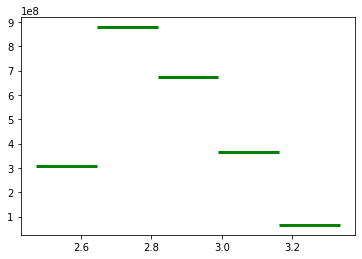

In [ ]:
bin_means, bin_edges, binnumber =stats.binned_statistic(df_mix[df_2010]["Fuel_Price"],df_mix[df_2010]["Weekly_Sales"], 'sum', bins=5)
plt.hlines(bin_means, bin_edges[:-1], bin_edges[1:], colors='g', lw=3,label='binned statistic of data')

plt.show()

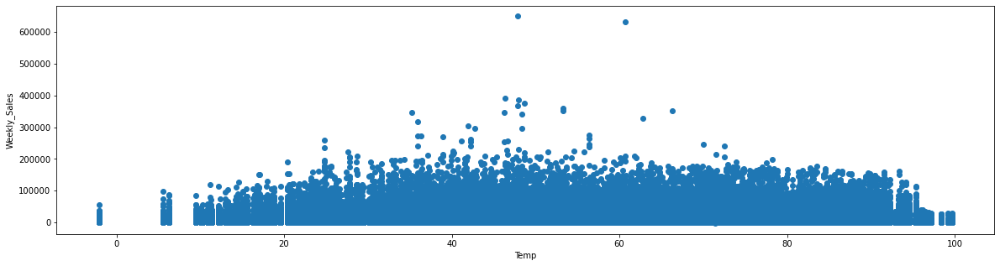

In [ ]:
#temp sales plot in 2010
bar, ax = plt.subplots(figsize = (20,5))
df_2010=(df_mix["Date"] <"2012-01-01") & (df_mix["Date"] >"2010-12-31")
plt.scatter(df_mix[df_2010]["Temperature"],df_mix[df_2010]["Weekly_Sales"])
plt.xlabel('Temp')
plt.ylabel('Weekly_Sales')

plt.show()


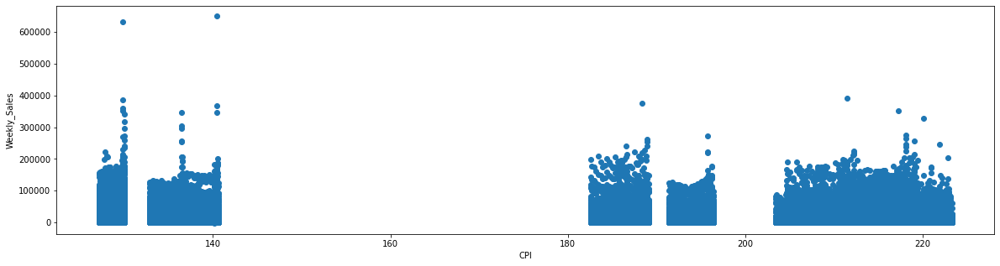

In [ ]:
#CPIsales plot in 2010
bar, ax = plt.subplots(figsize = (20,5))
df_2010=(df_mix["Date"] <"2012-01-01") & (df_mix["Date"] >"2010-12-31")
plt.scatter(df_mix[df_2010]["CPI"],df_mix[df_2010]["Weekly_Sales"])
plt.xlabel('CPI')
plt.ylabel('Weekly_Sales')

plt.show()

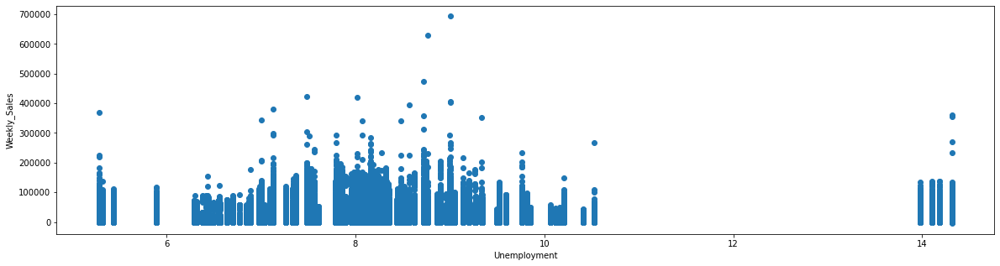

In [ ]:
#Unemployment sales plot in 2010
bar, ax = plt.subplots(figsize = (20,5))
df_2010=(df_mix["Date"] <"2011-01-01")
plt.scatter(df_mix[df_2010]["Unemployment"],df_mix[df_2010]["Weekly_Sales"])
plt.xlabel('Unemployment')
plt.ylabel('Weekly_Sales')

plt.show()

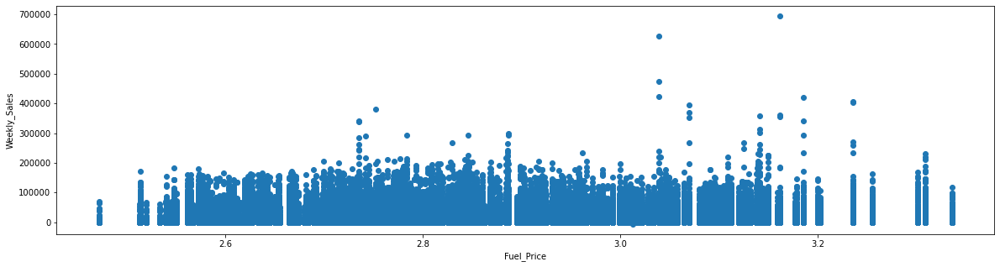

In [ ]:
#fuel price sales plot in 2010
bar, ax = plt.subplots(figsize = (20,5))
df_2010=(df_mix["Date"] <"2011-01-01")
plt.scatter(df_mix[df_2010]["Fuel_Price"],df_mix[df_2010]["Weekly_Sales"])
plt.xlabel('Fuel_Price')
plt.ylabel('Weekly_Sales')

plt.show()

NameError: name 'df1' is not defined

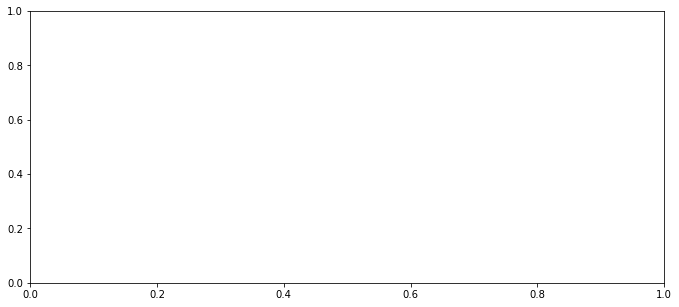

In [ ]:
fig = plt.figure(figsize=(25,5))
ax1=fig.add_subplot(121)
sns.histplot(ax=ax1, x="avg_hrs_month",hue="left",data=df1,bins=5,palette="Set1")

In [ ]:
pd.DataFrame(df_train['IsHoliday'].value_counts())

,IsHoliday
False,391909
True,29661


Text(0.5, 1.0, 'IsHoliday')

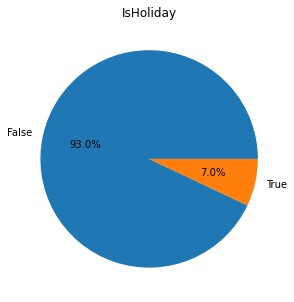

In [ ]:
bar, ax = plt.subplots(figsize = (5,5))
plt.pie(df_train['IsHoliday'].value_counts(),labels=df_train["IsHoliday"].value_counts().index,autopct="%.1f%%")
plt.title('IsHoliday')

In [ ]:
a=(df_mix["IsHoliday_x"] ==1)
b=(df_mix["IsHoliday_x"] ==0)
d = {'Holiday': [1], 'Weekly_Sales': df_mix[a]["Weekly_Sales"].sum()}
f = {'Holiday': [0], 'Weekly_Sales': df_mix[b]["Weekly_Sales"].sum()}
df_holiday_sales = pd.DataFrame(data=d).append(pd.DataFrame(f),ignore_index=True)
df_holiday_sales
#sns.barplot(data=df_holiday_sales, x="Holiday", y="Weekly_Sales")


,Holiday,Weekly_Sales
0,1,5.052996e+08
1,0,6.231919e+09


In [ ]:
g=df_mix[df_mix["IsHoliday_x"] ==1]
g.drop_duplicates(subset = "Date").loc[:, ['Date']]

,Date
73,2010-02-12
2218,2010-09-10
3014,2010-11-26
3372,2010-12-31
3800,2011-02-11
5940,2011-09-09
6731,2011-11-25
7096,2011-12-30
7527,2012-02-10
9667,2012-09-07


In [ ]:
print("14",df_mix[(df_mix["IsHoliday_x"] ==1)&(df_mix["Store"] ==14)].groupby("Dept")["Weekly_Sales"].sum().nlargest(3))
print("20",df_mix[(df_mix["IsHoliday_x"] ==1)&(df_mix["Store"] ==20)].groupby("Dept")["Weekly_Sales"].sum().nlargest(3))
print("13",df_mix[(df_mix["IsHoliday_x"] ==1)&(df_mix["Store"] ==13)].groupby("Dept")["Weekly_Sales"].sum().nlargest(3))
print("4",df_mix[(df_mix["IsHoliday_x"] ==1)&(df_mix["Store"] ==4)].groupby("Dept")["Weekly_Sales"].sum().nlargest(3))

KeyError: 'Column not found: Weekly_Sales'

In [ ]:
for i in range(1,46):
    store_sales=(df_mix["Store"] ==i)
    print("Store %s Total sales:%d"%(i,df_mix[store_sales]["Weekly_Sales"].sum()))

Store 1 Total sales:222402808
Store 2 Total sales:275382440
Store 3 Total sales:57586735
Store 4 Total sales:299543953
Store 5 Total sales:45475688
Store 6 Total sales:223756130
Store 7 Total sales:81598275
Store 8 Total sales:129951181
Store 9 Total sales:77789218
Store 10 Total sales:271617713
Store 11 Total sales:193962786
Store 12 Total sales:144287230
Store 13 Total sales:286517703
Store 14 Total sales:288999911
Store 15 Total sales:89133683
Store 16 Total sales:74252425
Store 17 Total sales:127782138
Store 18 Total sales:155114734
Store 19 Total sales:206634862
Store 20 Total sales:301397792
Store 21 Total sales:108117878
Store 22 Total sales:147075648
Store 23 Total sales:198750617
Store 24 Total sales:194016021
Store 25 Total sales:101061179
Store 26 Total sales:143416393
Store 27 Total sales:253855916
Store 28 Total sales:189263680
Store 29 Total sales:77141554
Store 30 Total sales:62716885
Store 31 Total sales:199613905
Store 32 Total sales:166819246
Store 33 Total sales:3716

In [ ]:
d = {'Store': [1], 'Weekly_Sales': [222402808]}
df_store_sales = pd.DataFrame(data=d)
for i in range(2,46):
    store_sales=(df_mix["Store"] ==i)
    f = {'Store': [i], 'Weekly_Sales': [df_mix[store_sales]["Weekly_Sales"].sum()]}
    df_store_sales=df_store_sales.append(pd.DataFrame(f),ignore_index=True)
df_store_sales.sort_values(by=['Weekly_Sales'],ascending=False)

,Store,Weekly_Sales
19,20,3.013978e+08
3,4,2.995440e+08
13,14,2.889999e+08
12,13,2.865177e+08
1,2,2.753824e+08
9,10,2.716177e+08
26,27,2.538559e+08
5,6,2.237561e+08
0,1,2.224028e+08
38,39,2.074455e+08


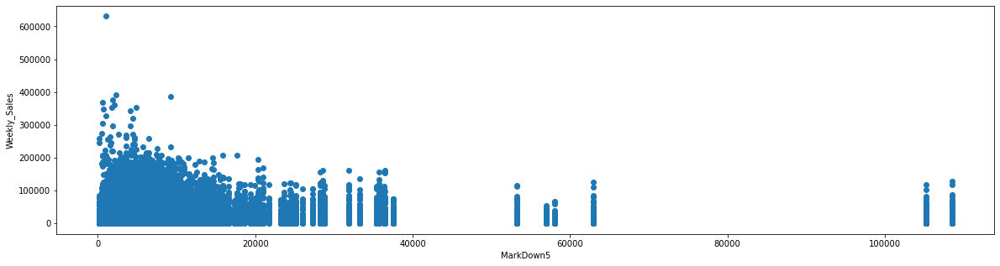

In [ ]:
md_not_null=(df_mix["MarkDown1"].notnull())&(df_mix["MarkDown2"].notnull())&(df_mix["MarkDown3"].notnull())&(df_mix["MarkDown4"].notnull())&(df_mix["MarkDown5"].notnull())
#df_mix[md_not_null]
bar, ax = plt.subplots(figsize = (20,5))
plt.scatter(df_mix[md_not_null]["MarkDown5"],df_mix[md_not_null]["Weekly_Sales"])
plt.xlabel('MarkDown5')
plt.ylabel('Weekly_Sales')

plt.show()

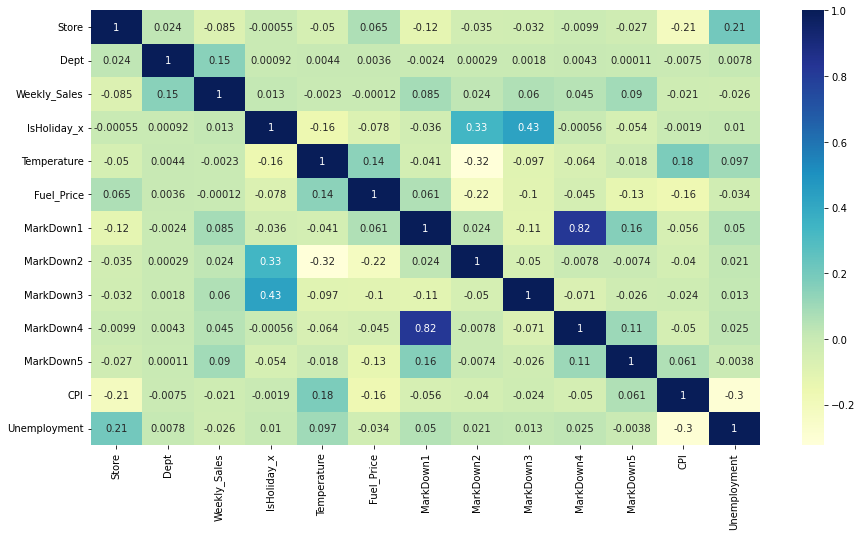

In [ ]:
sns.heatmap(df_mix.corr(),annot=True, cmap="YlGnBu")
plt.gcf().set_size_inches(15, 8)